Drive link to the datasets:

https://drive.google.com/drive/folders/1gtX7kKTHwKQ6MuzZU6N9PmPTWG3uG_A4?usp=share_link

In [1]:
pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
pip install clean-text

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# Importing all the required libraries

import nltk
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import pylab
from nltk.util import bigrams
import numpy as np
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import FreqDist
import networkx as nx
import re
from cleantext import clean
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
# Adding most occuring words that could not be removed while preprocessing to the exisiting stopwords list which occured in elon's tweets 

st_words=stopwords.words("english")
st_words.append('http')
st_words.append("'s")
st_words.append("n't")
st_words.append("'re")
st_words.append("''")


In [5]:
# Getting the tweets from the "tweets" column of his data sets
# Removing the stop-words using nltk-word-tokenizer
# Removing emojis using clean text
# Removing the characters mentioned in "c" below from all his tweets
# Storing all the filtered text year wise in a Python dictionary-tweet

tweet={}
c='@:).,;!(?%&`"'
for i in range(2017,2023):
  t_dset=pd.read_csv('/content/drive/MyDrive/FDA_Project3_Task2/'+str(i)+'.csv')
  tw_list=t_dset['tweet'].values
  tw_block=(" ".join(tw_list)).lower()
  tw_block=clean(tw_block, no_emoji=True)
  tokens = word_tokenize(tw_block)
  filtered_text = [t for t in tokens if not t in st_words]
  txt_block=" ".join(filtered_text)
  for char in c:
    txt_block = txt_block.replace(char, "")
  text_fin=re.sub(r'http\S+', '', txt_block)
  tweet[i]=text_fin


In [6]:
# Getting word-frequency using nltk
# Getting year wise dataframes with columns- Words,Frequency in descending and Rank

freq_dfs={}
for i in tweet.keys():
  text = tweet[i]
  words = text.split()                              # Getting all the words in a list by separating them by space 
  fdist1 = FreqDist(words)                          # Calculating their frequency 
  words=list(fdist1.keys())
  values=list(fdist1.values())
  df=pd.DataFrame()
  col_name='Words_'+str(i)
  df[col_name]=words
  df['Frequency']=values
  ct=0
  for j in df.iloc[:,0].values:                      # Checking again for useles stop words and removing them from dataframe
    if(j in st_words):
      df.iloc[ct,1]=0
    ct=ct+1
  df.sort_values(by=['Frequency'],inplace=True,ascending=False)
  df=df.reset_index(drop=True)
  df['Rank']=df.index+1
  freq_dfs[i]=df                                     # Adding the dataframes of all the years in a loop to a dictionary freq_dfs

In [7]:
# Displaying top 10 words in the descending order of their frequency of year 2017

df_2017=freq_dfs[2017]
df_2017.head(10)

,Words_2017,Frequency,Rank
0,tesla,308,1
1,model,208,2
2,good,171,3
3,rocket,149,4
4,like,137,5
5,yes,132,6
6,spacex,125,7
7,launch,112,8
8,would,110,9
9,next,103,10


In [8]:
# Displaying top 10 words in the descending order of their frequency of year 2018

df_2018=freq_dfs[2018]
df_2018.head(10)

,Words_2018,Frequency,Rank
0,tesla,450,1
1,car,120,2
2,yes,108,3
3,3,105,4
4,good,102,5
5,model,98,6
6,like,94,7
7,spacex,88,8
8,would,83,9
9,people,74,10


In [9]:
# Displaying top 10 words in the descending order of their frequency of year 2019

df_2019=freq_dfs[2019]
df_2019.head(10)

,Words_2019,Frequency,Rank
0,tesla,1316,1
1,spacex,427,2
2,yes,393,3
3,model,373,4
4,good,358,5
5,like,314,6
6,erdayastronaut,300,7
7,would,296,8
8,car,284,9
9,3,262,10


In [10]:
# Displaying top 10 words in the descending order of their frequency of year 2020

df_2020=freq_dfs[2020]
df_2020.head(10)

,Words_2020,Frequency,Rank
0,tesla,1681,1
1,spacex,635,2
2,erdayastronaut,561,3
3,yes,554,4
4,good,471,5
5,flcnhvy,424,6
6,model,403,7
7,would,394,8
8,like,392,9
9,great,370,10


In [11]:
# Displaying top 10 words in the descending order of their frequency of year 2021

df_2021=freq_dfs[2021]
df_2021.head(10)

,Words_2021,Frequency,Rank
0,tesla,327,1
1,spacex,237,2
2,wholemarsblog,189,3
3,teslaownerssv,119,4
4,ppathole,116,5
5,erdayastronaut,111,6
6,great,102,7
7,good,98,8
8,much,93,9
9,would,92,10


In [12]:
# Displaying top 10 words in the descending order of their frequency of year 2022

df_2022=freq_dfs[2022]
df_2022.head(10)

,Words_2022,Frequency,Rank
0,tesla,108,1
1,wholemarsblog,84,2
2,spacex,58,3
3,teslaownerssv,50,4
4,sawyermerritt,36,5
5,people,34,6
6,would,32,7
7,yes,32,8
8,one,30,9
9,billym2k,30,10


<Figure size 432x288 with 0 Axes>

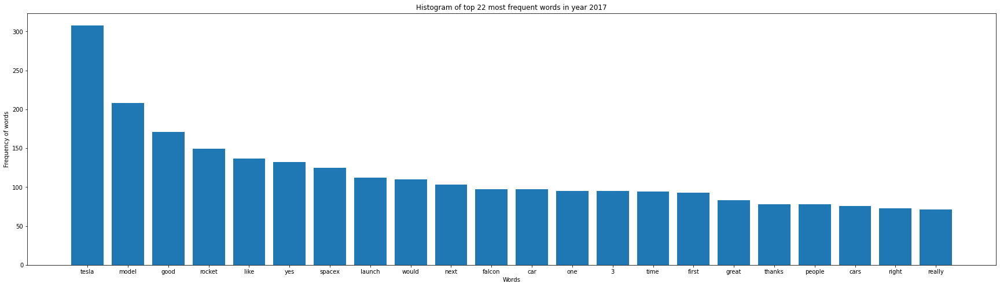

<Figure size 432x288 with 0 Axes>

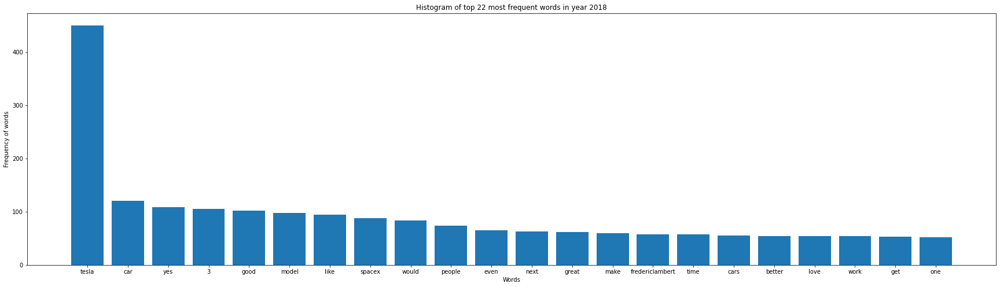

<Figure size 432x288 with 0 Axes>

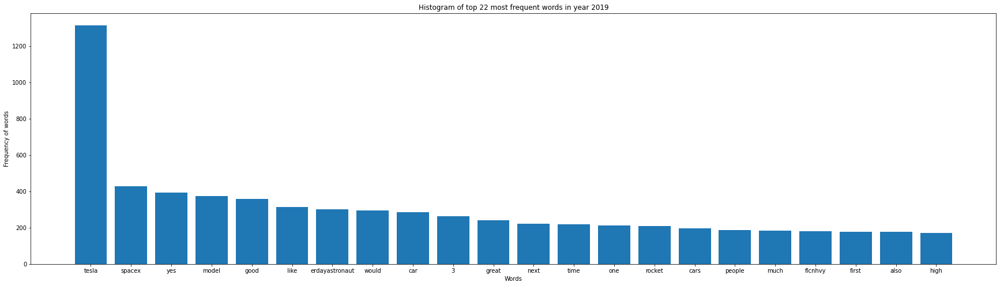

<Figure size 432x288 with 0 Axes>

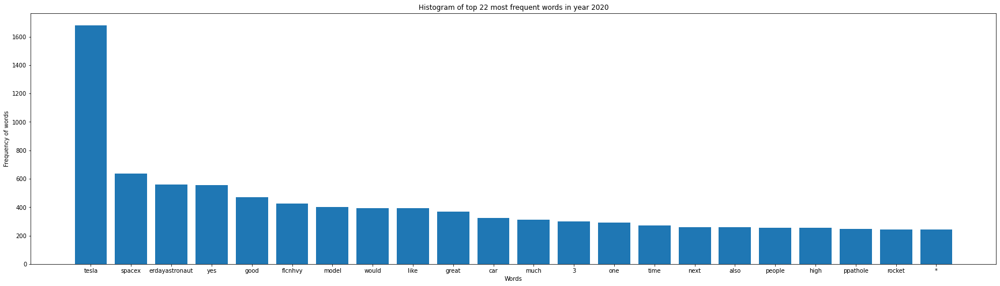

<Figure size 432x288 with 0 Axes>

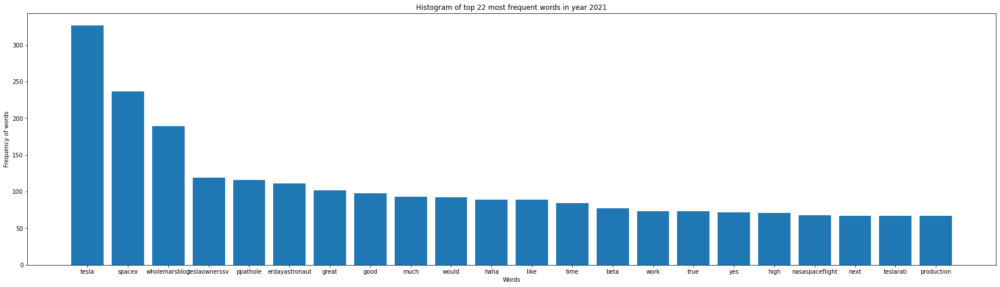

<Figure size 432x288 with 0 Axes>

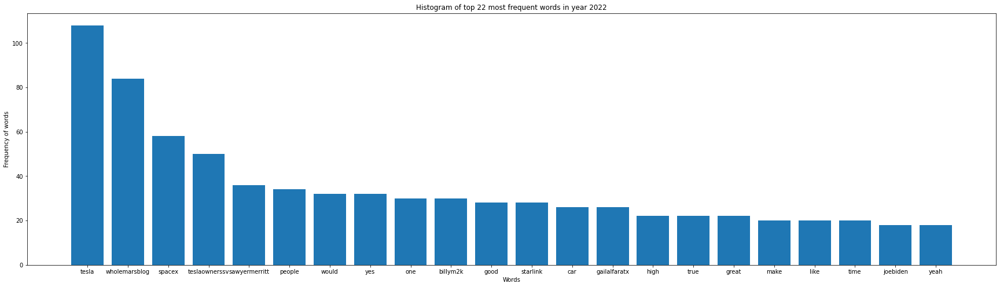

In [13]:
# Getting histogram of Words from a Elon's tweets of years 2017,2018,2019,2020,2021,2022

for i in freq_dfs.keys():
  t_df=freq_dfs[i].iloc[:,0:2].head(22)
  fig = plt.figure()   # Initializes current figure
  fig = plt.figure(figsize=(30,8))
  plt.bar(t_df.iloc[:,0],t_df.iloc[:,1])
  plt.title('Histogram of top 22 most frequent words in year '+str(i))
  plt.xlabel('Words')
  plt.ylabel('Frequency of words')  

<Figure size 432x288 with 0 Axes>

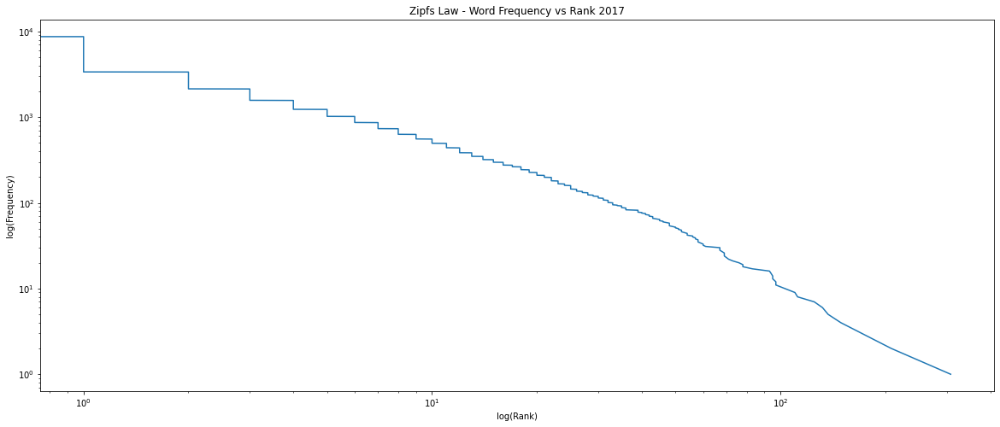

<Figure size 432x288 with 0 Axes>

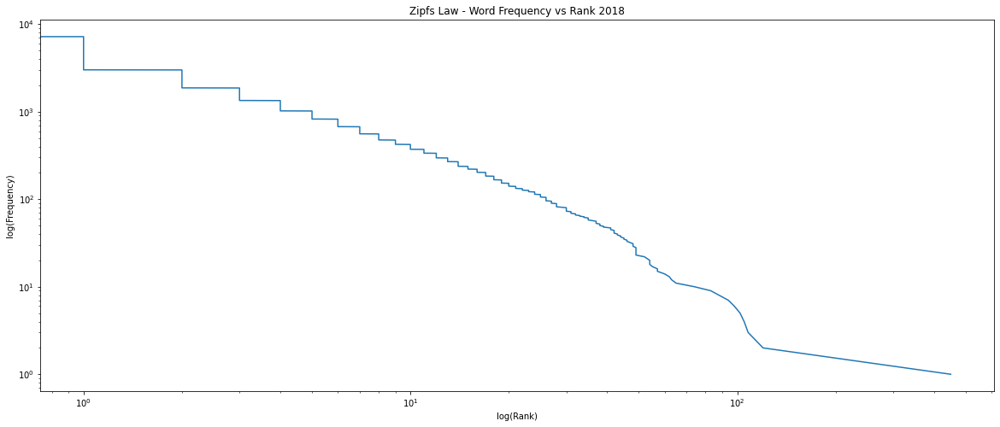

<Figure size 432x288 with 0 Axes>

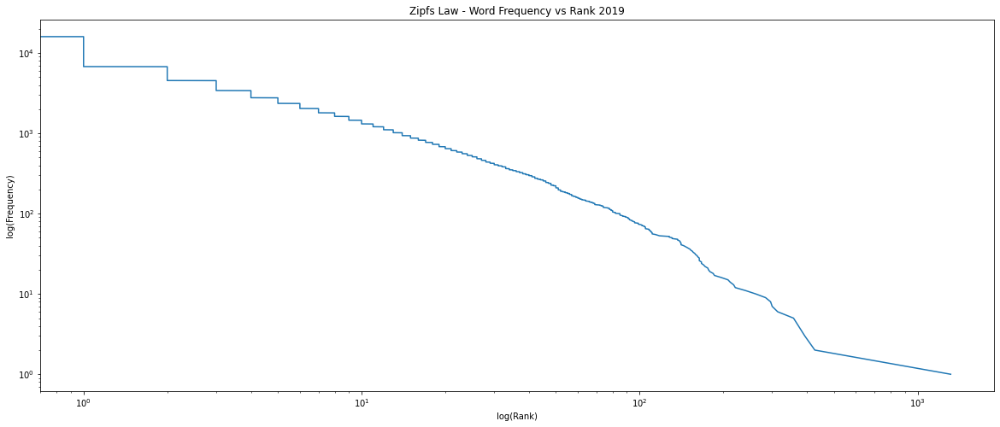

<Figure size 432x288 with 0 Axes>

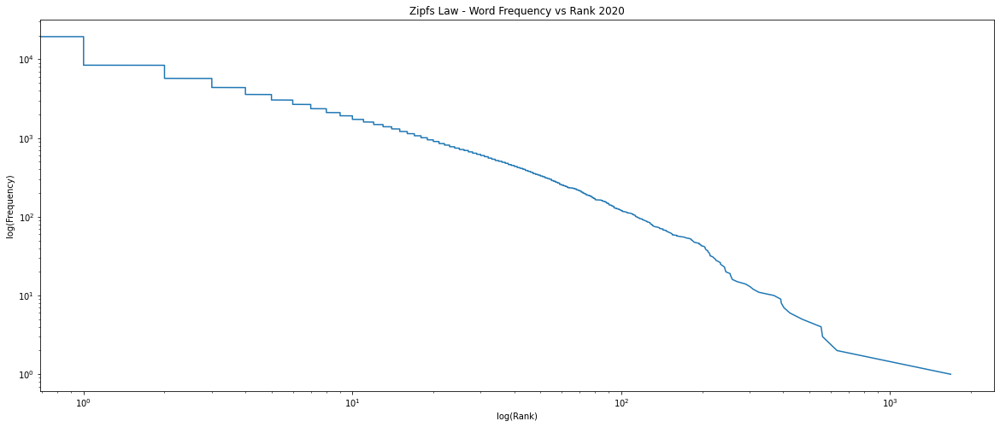

<Figure size 432x288 with 0 Axes>

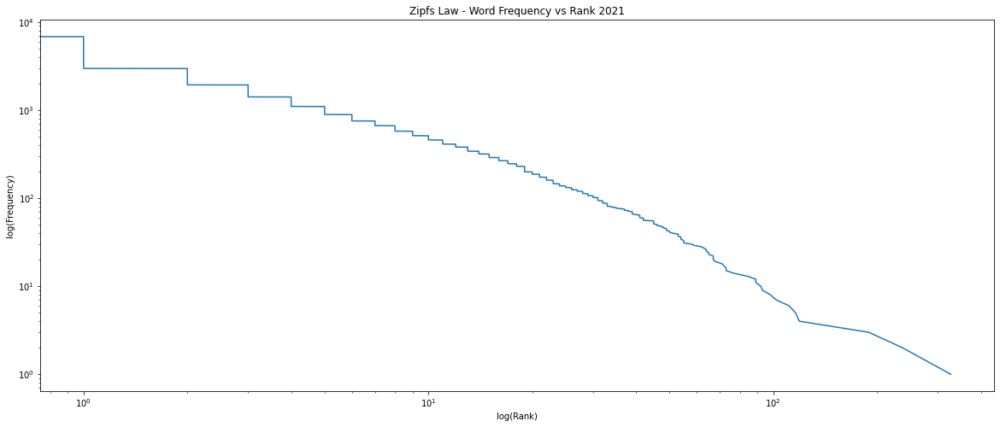

<Figure size 432x288 with 0 Axes>

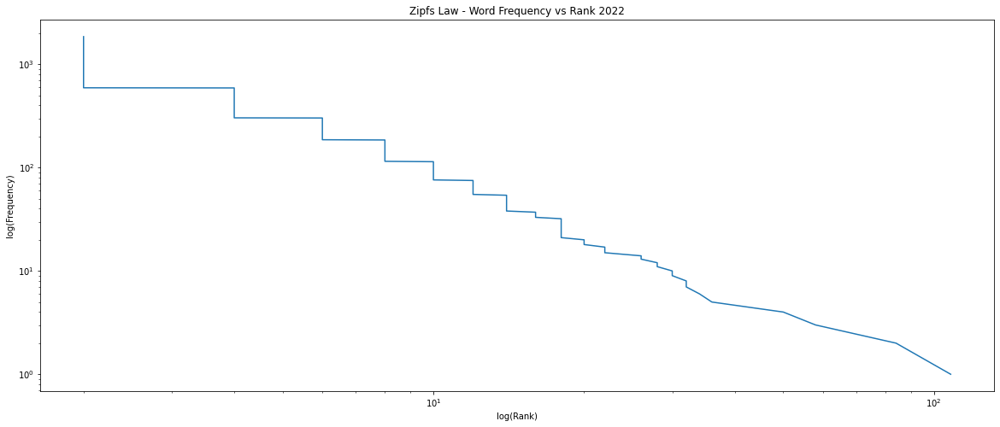

In [14]:
# Plotting Rank vs Frequency , Implementing Zipf's Law

for i in freq_dfs.keys():
  t_df=freq_dfs[i].iloc[:,1:3]
  fig = plt.figure()   # Initializes current figure
  fig = plt.figure(figsize=(20,8))
  pylab.loglog(t_df.iloc[:,0],t_df.iloc[:,1],label="Rank vs Word Frequency")
  plt.title('Zipfs Law - Word Frequency vs Rank '+str(i))
  plt.xlabel('log(Rank)')
  plt.ylabel('log(Frequency)')  

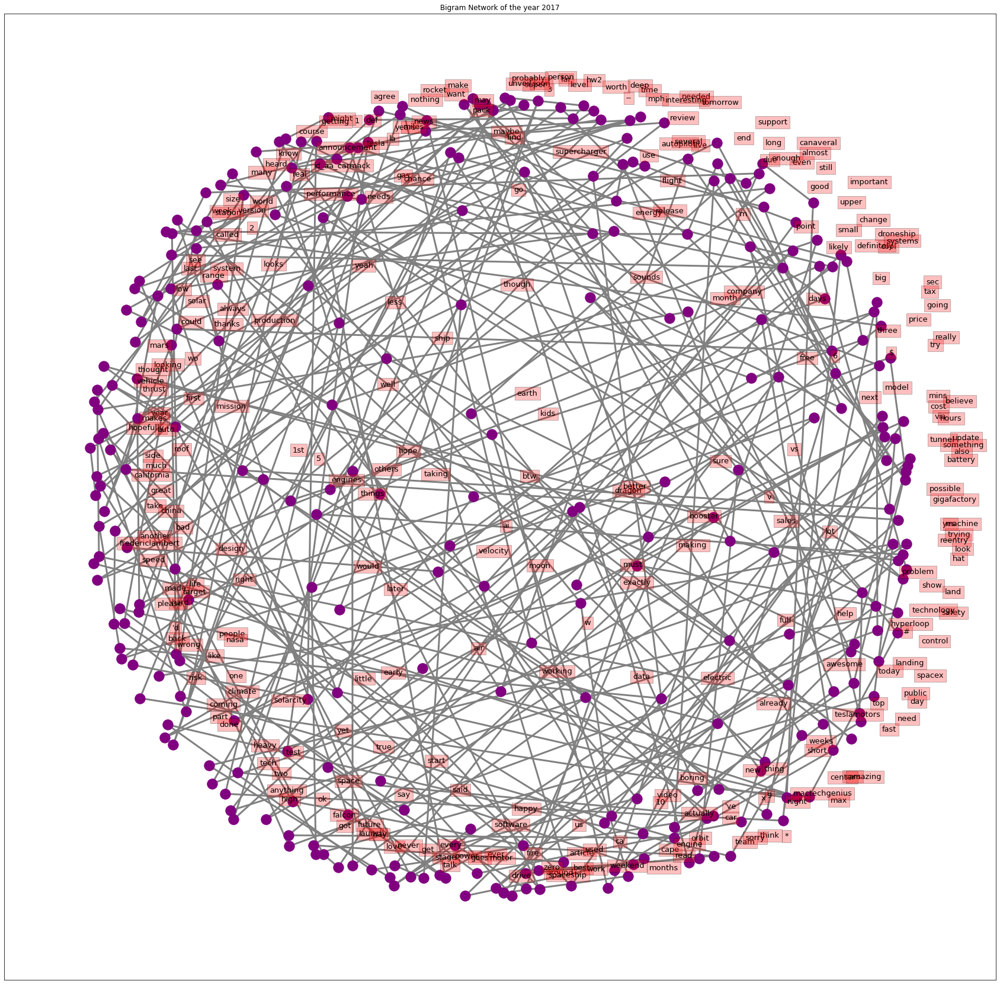

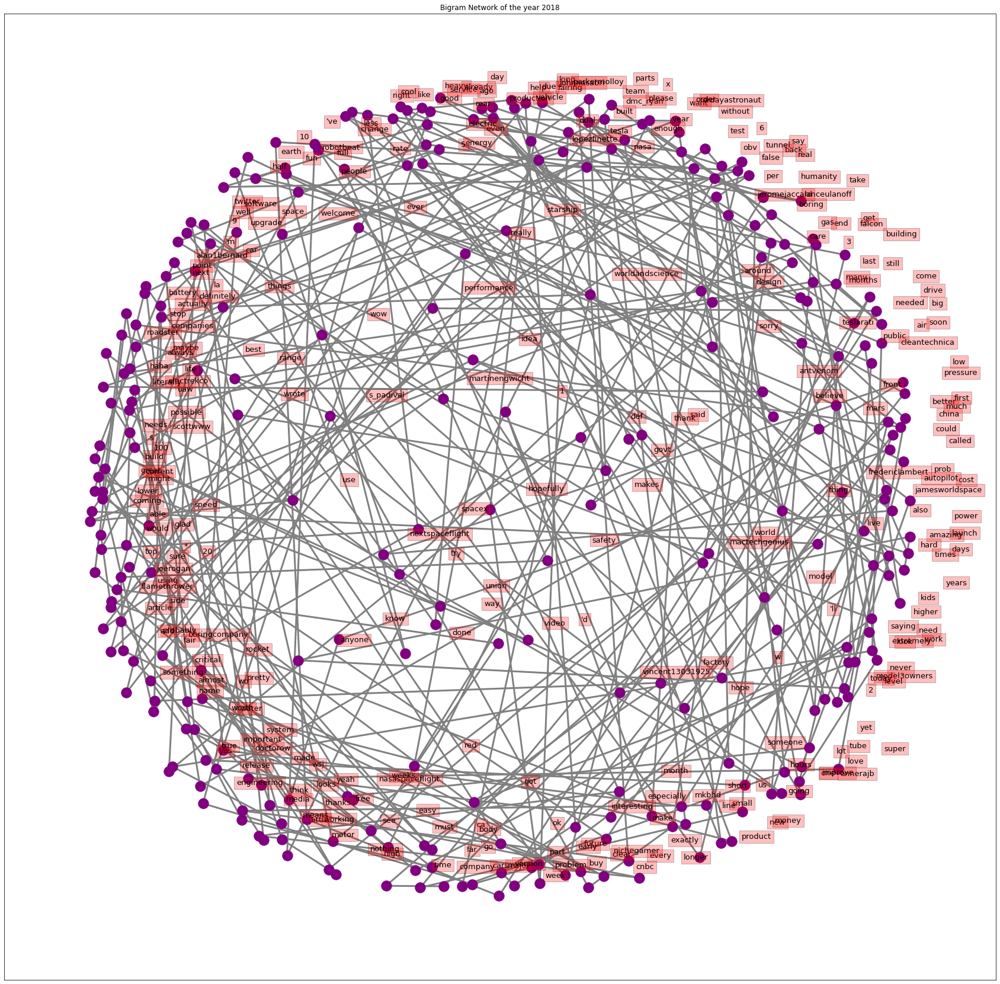

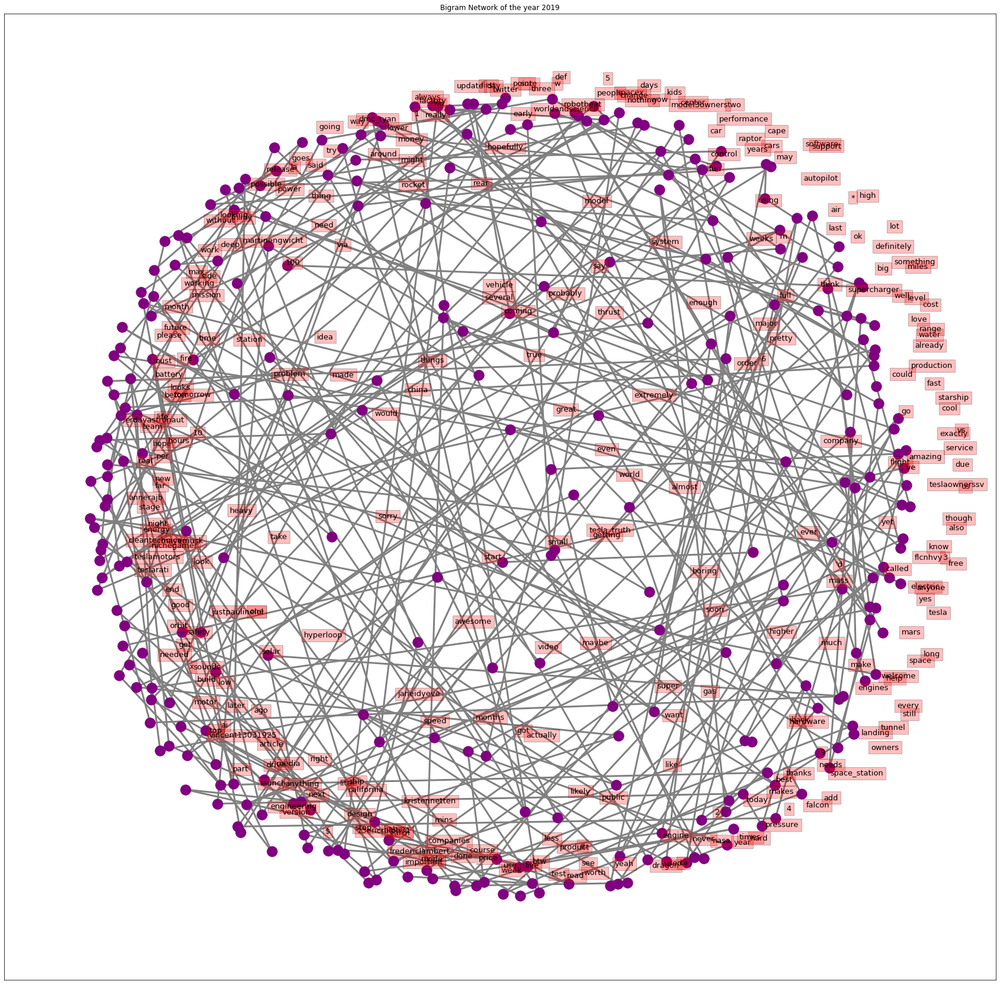

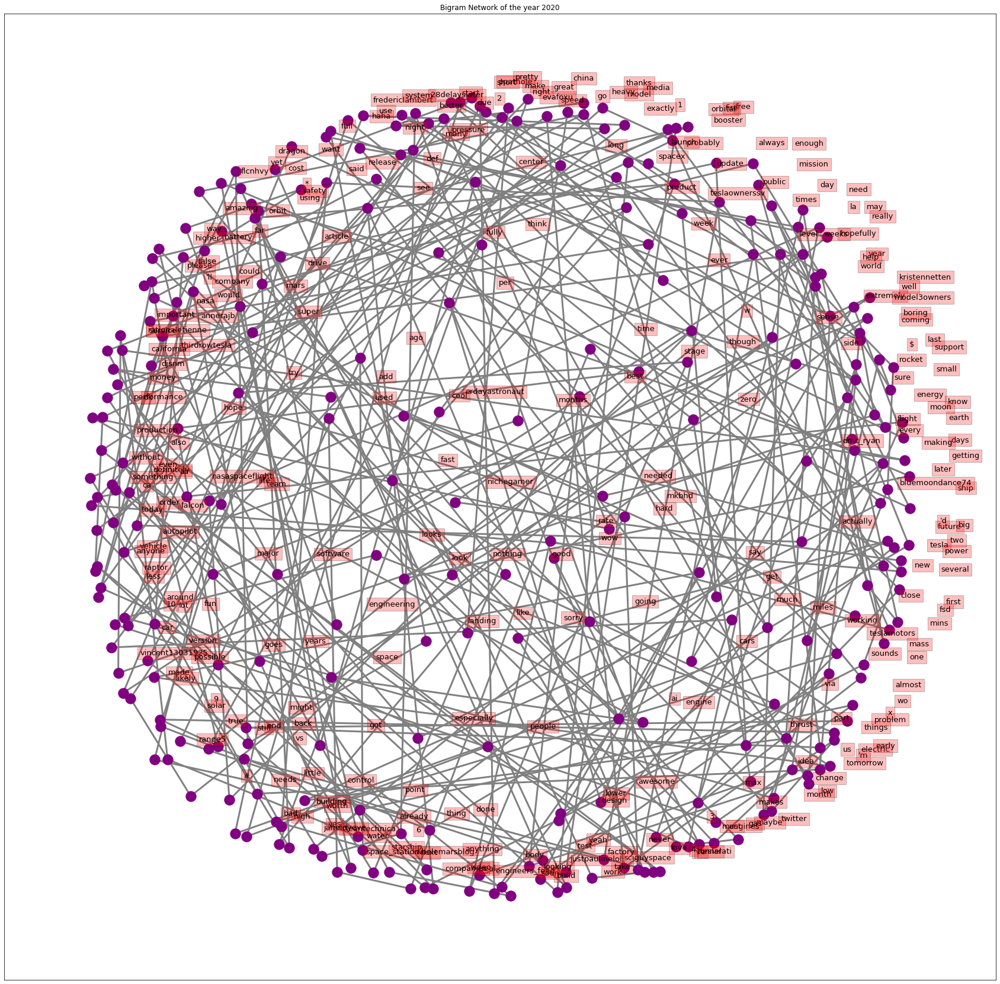

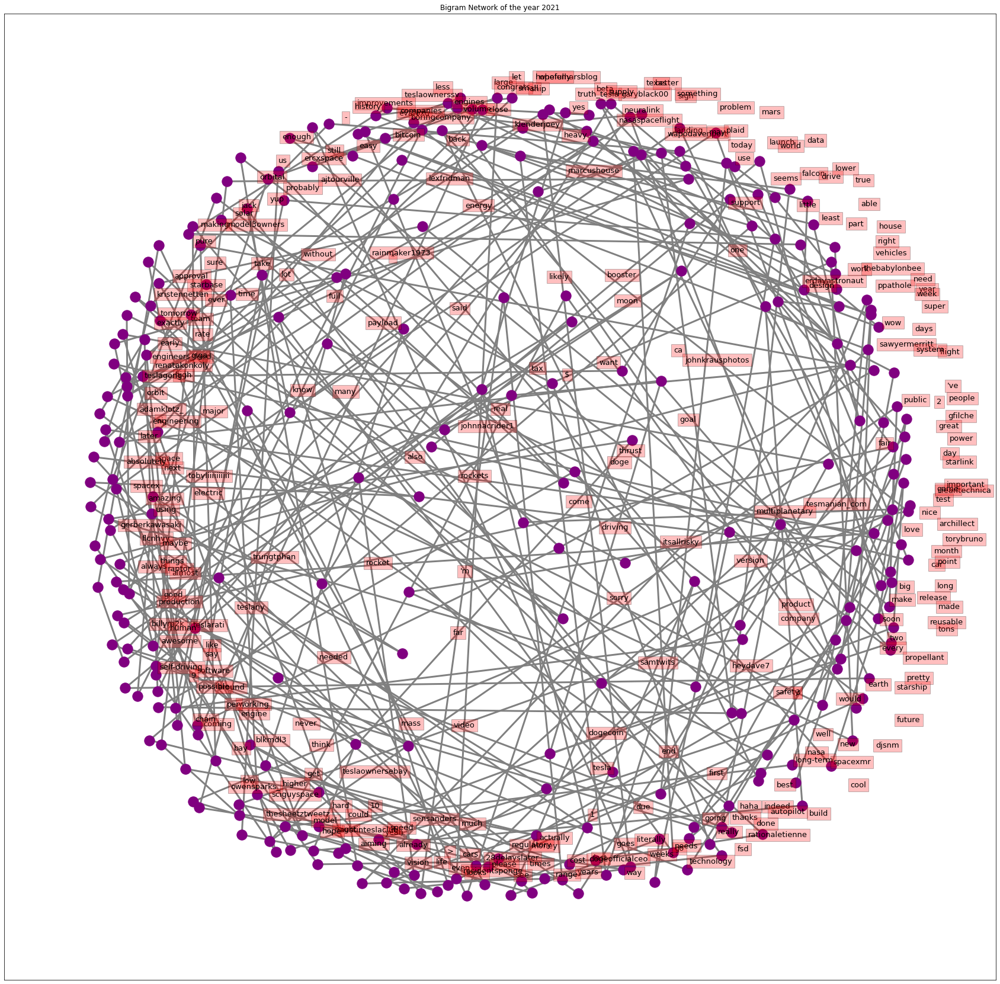

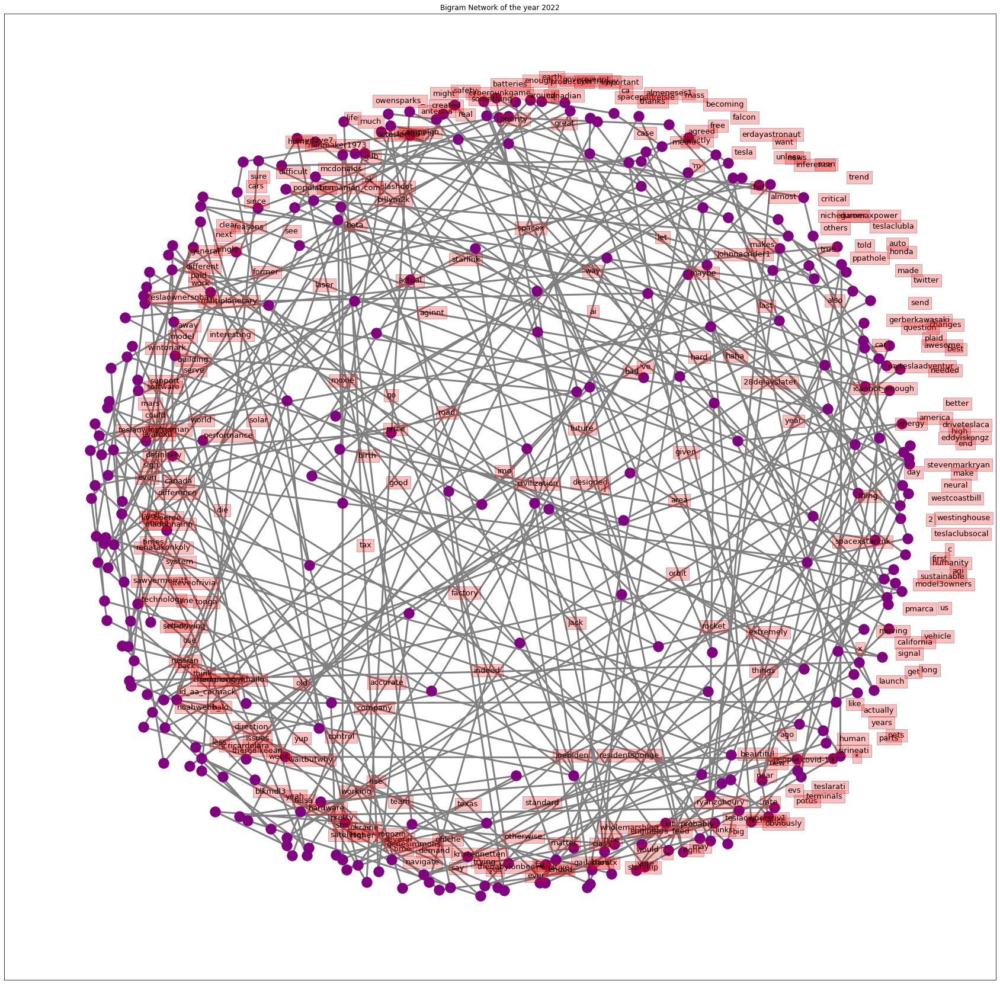

In [15]:
# Getting the Network of bigrams of words created from all the tweets in years 2017,2018,2019,2020,2021

for i in freq_dfs.keys():
  df=freq_dfs[i]
  col_name='Words_'+str(i)
  freq_list=df[col_name].tolist()


  bigrams=list(nltk.bigrams(freq_list))

  bigrams_dist=nltk.FreqDist(bigrams)
  df_bigram=pd.DataFrame(bigrams_dist.most_common(300),columns=['Bigrams','Frequency'])


  #BIGRAM
  # Create dictionary of bigrams and their counts
  d = df_bigram.set_index('Bigrams').T.to_dict('records')

  # Create network plot 
  G = nx.Graph()

  # Create connections between nodes
  for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

  fig, ax = plt.subplots(figsize=(30, 30))

  pos = nx.spring_layout(G, k=2)

  # Plot networks
  nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

  for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
  plt.title('Bigram Network of the year '+str(i))
  plt.show()
